In [20]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/prueba-2/Screenshot from 2024-11-06 10-06-04.png
/kaggle/input/prueba/Screenshot from 2024-11-06 09-20-57.png
/kaggle/input/flood-area-segmentation/metadata.csv
/kaggle/input/flood-area-segmentation/Mask/1017.png
/kaggle/input/flood-area-segmentation/Mask/2015.png
/kaggle/input/flood-area-segmentation/Mask/1084.png
/kaggle/input/flood-area-segmentation/Mask/2021.png
/kaggle/input/flood-area-segmentation/Mask/1012.png
/kaggle/input/flood-area-segmentation/Mask/48.png
/kaggle/input/flood-area-segmentation/Mask/3012.png
/kaggle/input/flood-area-segmentation/Mask/1037.png
/kaggle/input/flood-area-segmentation/Mask/2009.png
/kaggle/input/flood-area-segmentation/Mask/1023.png
/kaggle/input/flood-area-segmentation/Mask/3070.png
/kaggle/input/flood-area-segmentation/Mask/37.png
/kaggle/input/flood-area-segmentation/Mask/1048.png
/kaggle/input/flood-area-segmentation/Mask/3068.png
/kaggle/input/flood-area-segmentation/Mask/1000.png
/kaggle/input/flood-area-segmentation/Mask/35.png

In [21]:
!pip install segmentation_models_pytorch

In [22]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

In [23]:
image_dir = "/kaggle/input/flood-area-segmentation/Image"
mask_dir = "/kaggle/input/flood-area-segmentation/Mask"

images = sorted([os.path.join(image_dir, file) for file in os.listdir(image_dir)])
masks = sorted([os.path.join(mask_dir, file) for file in os.listdir(mask_dir)])

data = pd.DataFrame({"image": images, "mask": masks})

trainval_df, test_df = train_test_split(data, train_size=0.8, shuffle=True, random_state=123)

# Now, split the remaining 80% (trainval_df) into 90% train and 10% validation
train_df, val_df = train_test_split(trainval_df, train_size=0.9, shuffle=True, random_state=123)

# Reset indexes to avoid errors with images names 
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# Check the resulting sizes
print(f"Train set: {len(train_df)}")
print(f"Validation set: {len(val_df)}")
print(f"Test set: {len(test_df)}")

Train set: 208
Validation set: 24
Test set: 58


/kaggle/input/flood-area-segmentation/Image/1063.jpg
/kaggle/input/flood-area-segmentation/Image/3002.jpg
/kaggle/input/flood-area-segmentation/Image/3050.jpg
/kaggle/input/flood-area-segmentation/Image/2007.jpg
/kaggle/input/flood-area-segmentation/Image/1067.jpg


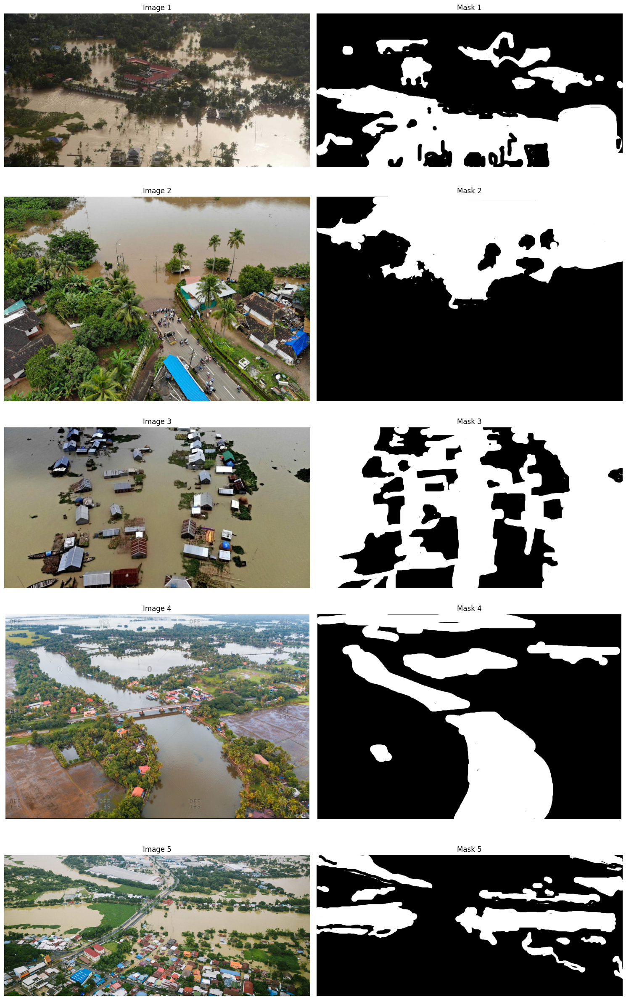

In [24]:
def visualize_images(dataframe, num_samples=5):
    """
    Function to visualize a few images and their corresponding masks.
    
    Parameters:
        dataframe (pd.DataFrame): DataFrame containing 'image' and 'mask' columns.
        num_samples (int): Number of samples to visualize. Default is 5.
    """
    samples = dataframe.sample(n=num_samples, random_state=1234)  # Randomly sample images from dataframe

    plt.figure(figsize=(15, num_samples * 5))
    
    for i, (image_path, mask_path) in enumerate(zip(samples['image'], samples['mask'])):
        # Load image and mask
        image = Image.open(image_path)
        print(image_path)
        mask = Image.open(mask_path)

        # Plot image
        plt.subplot(num_samples, 2, 2*i + 1)
        plt.imshow(image)
        plt.title(f"Image {i+1}")
        plt.axis('off')
        
        # Plot mask
        plt.subplot(num_samples, 2, 2*i + 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f"Mask {i+1}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example of usage with the train_df
visualize_images(train_df, num_samples=5)

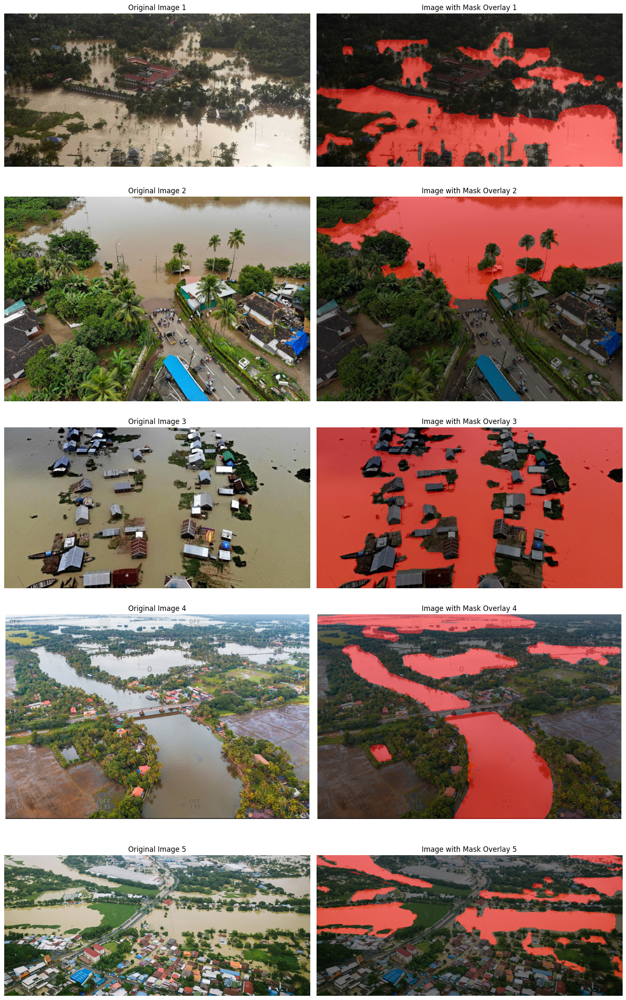

In [25]:
def visualize_images_with_overlay(dataframe, num_samples=5, alpha=0.5):
    """
    Function to visualize a few images with their corresponding masks overlaid.
    
    Parameters:
        dataframe (pd.DataFrame): DataFrame containing 'image' and 'mask' columns.
        num_samples (int): Number of samples to visualize. Default is 5.
        alpha (float): Transparency level for the mask overlay. Default is 0.5.
    """
    samples = dataframe.sample(n=num_samples, random_state=1234)  # Randomly sample images from dataframe

    plt.figure(figsize=(15, num_samples * 5))
    
    for i, (image_path, mask_path) in enumerate(zip(samples['image'], samples['mask'])):
        # Load image and mask
        image = Image.open(image_path).convert('RGB')  # Ensure image is in RGB format
        mask = Image.open(mask_path).convert('L')  # Load the mask and convert to grayscale (L mode)
        
        # Apply a color map to the mask to overlay (this is optional, but makes it more visible)
        mask_colored = ImageOps.colorize(mask, black="black", white="red")
        
        # Overlay the mask onto the image using the alpha value
        overlay = Image.blend(image, mask_colored, alpha=alpha)
        
        # Plot original image and overlay
        plt.subplot(num_samples, 2, 2*i + 1)
        plt.imshow(image)
        plt.title(f"Original Image {i+1}")
        plt.axis('off')
        
        plt.subplot(num_samples, 2, 2*i + 2)
        plt.imshow(overlay)
        plt.title(f"Image with Mask Overlay {i+1}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example of usage with the train_df
visualize_images_with_overlay(train_df, num_samples=5, alpha=0.5)

In [26]:
IMG_SIZE = (224, 224)  # Desired image size

def df_to_nparrays(df, img_size=IMG_SIZE):
    """
    Converts image and mask file paths in the DataFrame to NumPy arrays with resizing.

    Parameters:
        df (pd.DataFrame): DataFrame containing 'image' and 'mask' columns.
        img_size (tuple): Target size for the images (height, width).
    
    Returns:
        image_arrays (list of np.array): List of resized images as NumPy arrays.
        mask_arrays (list of np.array): List of resized masks as NumPy arrays.
    """
    image_arrays = []
    mask_arrays = []
    
    for _, row in df.iterrows():
        # Open image and mask
        image = Image.open(row['image']).convert('RGB')  # Convert image to RGB format
        mask = Image.open(row['mask']).convert('L')      # Convert mask to grayscale
        
        # Resize (crop) images and masks
        image_resized = image.resize(img_size)  # Resize image
        mask_resized = mask.resize(img_size)    # Resize mask
        
        # Convert to NumPy arrays
        image_np = np.array(image_resized)
        mask_np = np.array(mask_resized)
        
        binary_mask_array = (mask_np > 127).astype(np.uint8)  # 1 for pixels above 127, 0 otherwise
        
        # Append to lists
        image_arrays.append(image_np)
        mask_arrays.append(binary_mask_array)
    
    return np.array(image_arrays), np.array(mask_arrays)

# Convert and resize train_df and test_df to NumPy arrays
train_images_np, train_masks_np = df_to_nparrays(train_df)
test_images_np, test_masks_np = df_to_nparrays(test_df)
val_images_np, val_masks_np = df_to_nparrays(val_df)

In [27]:
import albumentations

import cv2

SOURCE_SIZE = 224
TARGET_SIZE = 224


train_augs = albumentations.Compose([
    albumentations.Rotate(limit=360, p=0.9, border_mode=cv2.BORDER_REPLICATE),
    albumentations.RandomSizedCrop((int(SOURCE_SIZE * 0.75), SOURCE_SIZE),
                                   TARGET_SIZE,
                                   TARGET_SIZE,
                                   interpolation=cv2.INTER_NEAREST),
    albumentations.HorizontalFlip(p=0.5),
])

val_augs = albumentations.Compose([
    albumentations.Resize(TARGET_SIZE, TARGET_SIZE, interpolation=cv2.INTER_NEAREST)
])

In [28]:
# Function to compute mean and std
def compute_mean_std(image_paths):
    channels = [0, 0, 0]  # R, G, B
    channel_counts = [0, 0, 0]  # Number of pixels in each channel
    
    for image_path in image_paths:
        image = Image.open(image_path).convert("RGB")
        image_np = np.array(image) / 255.0  # Scale pixel values to [0, 1]
        
        for i in range(3):  # For each channel
            channels[i] += np.sum(image_np[:, :, i])
            channel_counts[i] += image_np.shape[0] * image_np.shape[1]

    # Compute mean and std for each channel
    mean = [c / count for c, count in zip(channels, channel_counts)]
    std = [np.sqrt(np.sum((np.array([np.mean(image_np[:, :, i]) for image_path in image_paths]) - mean[i])**2) / len(image_paths)) for i in range(3)]
    
    return mean, std

# Example: Compute mean and std for your training images
train_image_paths = train_df["image"].tolist()  # Get image paths from your DataFrame
mean, std = compute_mean_std(train_image_paths)

print("Computed Mean:", mean)
print("Computed Std:", std)

Computed Mean: [0.49858108696687886, 0.4948950363969747, 0.45213825691828213]
Computed Std: [0.16074229459583433, 0.19969003288814977, 0.24751228910355882]


In [29]:
from PIL import Image
import segmentation_models_pytorch as smp
import torch.nn.functional as F
import torch.nn as nn
from tqdm.notebook import tqdm
import time

from torchvision import transforms as T
from torch.utils.data import Dataset, DataLoader
import torch

class Dataset:
    def __init__(
            self,
            images,
            masks,
            mean,
            std,
            augmentations=None
    ):
        
        self.images = images
        self.masks = masks
        self.augmentations = augmentations
        self.mean = mean
        self.std = std
        
        # Debugging: Check lengths
        print("Number of images:", len(self.images))
        print("Number of masks:", len(self.masks))

    def __getitem__(self, i):    
        image = self.images[i]
        mask = self.masks[i]
                
        # Check if image or mask is None after conversion
        if image is None or mask is None:
            print(f"Warning: Found None for image or mask at index {i}")
            return None, None


        if self.augmentations is not None:
            sample = self.augmentations(image=image, mask=mask)
            if sample['image'] is None or sample['mask'] is None:
                print(f"Warning: Augmentation returned None for index {i}")
                return None, None
            image, mask =  Image.fromarray(sample['image']) , sample['mask']

        if self.augmentations is None:
            image = Image.fromarray(image)

        t = T.Compose([T.ToTensor(), T.Normalize(self.mean, self.std)])
        image = t(image)
        mask = torch.from_numpy(mask).long()
        
        if image is None or mask is None:
            print(f"Warning: Final image or mask is None at index {i}")
            return None, None
        return image, mask

    
    def __len__(self):
        return len(self.images)

    def tiles(self, image, mask):
        # Assuming 'image' is of shape (C, H, W) = (3, H, W) for RGB
        img_patches = image.unfold(1, 512, 512).unfold(2, 768, 768)
        img_patches = img_patches.contiguous().view(-1, 3, 512, 768)

        # Assuming 'mask' is of shape (H, W) for grayscale
        mask_patches = mask.unfold(0, 512, 512).unfold(1, 768, 768)
        mask_patches = mask_patches.contiguous().view(-1, 512, 768)

        return img_patches, mask_patches
    
batch_size = 32

train_dataset = Dataset(train_images_np, train_masks_np, mean, std, train_augs)
val_dataset = Dataset(val_images_np, val_masks_np, mean, std, val_augs)
test_dataset = Dataset(test_images_np, test_masks_np, mean, std, val_augs)

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

Number of images: 208
Number of masks: 208
Number of images: 24
Number of masks: 24
Number of images: 58
Number of masks: 58


In [30]:
def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy

In [31]:
def mIoU(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union +smooth)
                iou_per_class.append(iou)
        return np.nanmean(iou_per_class)

In [32]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

def fit(epochs, model, train_loader, val_loader, criterion, optimizer, scheduler, patch=False):
    #torch.cuda.empty_cache()
    train_losses = []
    test_losses = []
    val_iou = []; val_acc = []
    train_iou = []; train_acc = []
    lrs = []
    min_loss = np.inf
    decrease = 1 ; not_improve=0

    model.to(device)
    fit_time = time.time()
    for e in range(epochs):
        since = time.time()
        running_loss = 0
        iou_score = 0
        accuracy = 0
        #training loop
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            #training phase
            image_tiles, mask_tiles = data

            image = image_tiles.to(device); mask =mask_tiles.to(device);
            #forward
            output = model(image)

            loss = criterion(output, mask)
            #evaluation metrics
            iou_score += mIoU(output, mask)
            accuracy += pixel_accuracy(output, mask)
            #backward
            loss.backward()
            optimizer.step() #update weight
            optimizer.zero_grad() #reset gradient

            #step the learning rate
            lrs.append(get_lr(optimizer))
            scheduler.step()

            running_loss += loss.item()


        else:
            model.eval()
            test_loss = 0
            test_accuracy = 0
            val_iou_score = 0
            #validation loop
            with torch.no_grad():
                for i, data in enumerate(tqdm(val_loader)):
                    image_tiles, mask_tiles = data

                    image = image_tiles.to(device); mask =mask_tiles.to(device);
                    output = model(image)
                    #evaluation metrics
                    val_iou_score +=  mIoU(output, mask)
                    test_accuracy += pixel_accuracy(output, mask)
                    #loss
                    loss = criterion(output, mask)
                    test_loss += loss.item()

            #calculation mean for each batch
            train_losses.append(running_loss/len(train_loader))
            test_losses.append(test_loss/len(val_loader))


            if min_loss > (test_loss/len(val_loader)):
                print('Loss Decreasing.. {:.3f} >> {:.3f} '.format(min_loss, (test_loss/len(val_loader))))
                min_loss = (test_loss/len(val_loader))
                decrease += 1
                if decrease % 5 == 0:
                    print('saving model...')
                    torch.save(model, 'Unet_efficientnet_b2_mIoU-{:.3f}.pt'.format(val_iou_score/len(val_loader)))


            if (test_loss/len(val_loader)) > min_loss:
                not_improve += 1
                min_loss = (test_loss/len(val_loader))
                print(f'Loss Not Decrease for {not_improve} time')

            #iou
            val_iou.append(val_iou_score/len(val_loader))
            train_iou.append(iou_score/len(train_loader))
            train_acc.append(accuracy/len(train_loader))
            val_acc.append(test_accuracy/ len(val_loader))
            print("Epoch:{}/{}..".format(e+1, epochs),
                  "Train Loss: {:.3f}..".format(running_loss/len(train_loader)),
                  "Val Loss: {:.3f}..".format(test_loss/len(val_loader)),
                  "Train mIoU:{:.3f}..".format(iou_score/len(train_loader)),
                  "Val mIoU: {:.3f}..".format(val_iou_score/len(val_loader)),
                  "Train Acc:{:.3f}..".format(accuracy/len(train_loader)),
                  "Val Acc:{:.3f}..".format(test_accuracy/len(val_loader)),
                  "Time: {:.2f}m".format((time.time()-since)/60))

    history = {'train_loss' : train_losses, 'val_loss': test_losses,
               'train_miou' :train_iou, 'val_miou':val_iou,
               'train_acc' :train_acc, 'val_acc':val_acc,
               'lrs': lrs}
    print('Total time: {:.2f} m' .format((time.time()- fit_time)/60))
    return history

In [33]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

Using device: cuda



In [34]:
# model = smp.Unet('resnet50',in_channels=3, encoder_weights='imagenet',classes=2, activation=None, encoder_depth=5, decoder_channels=[256, 128, 64, 32, 16])

In [35]:
# model = smp.Unet('vgg19',in_channels=3, encoder_weights='imagenet',classes=2, activation=None, encoder_depth=5, decoder_channels=[256, 128, 64, 32, 16])

In [36]:
# model = smp.Unet('mobilenet_v2',in_channels=3, encoder_weights='imagenet',classes=2, activation=None, encoder_depth=5, decoder_channels=[256, 128, 64, 32, 16])

In [37]:
model = smp.Unet('efficientnet-b2',in_channels=3, encoder_weights='imagenet',classes=2, activation=None, encoder_depth=5, decoder_channels=[256, 128, 64, 32, 16])
#decoder_attention_type ='scse'

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b2-8bb594d6.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b2-8bb594d6.pth
100%|██████████| 35.1M/35.1M [00:00<00:00, 82.6MB/s]


In [38]:
max_lr = 1e-2
epoch = 100
weight_decay = 1e-4

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_dataloader))

history = fit(epoch, model, train_dataloader, val_dataloader, criterion, optimizer, sched)

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. inf >> 0.662 
Epoch:1/100.. Train Loss: 0.659.. Val Loss: 0.662.. Train mIoU:0.471.. Val mIoU: 0.453.. Train Acc:0.636.. Val Acc:0.664.. Time: 0.06m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.662 >> 0.455 
Epoch:2/100.. Train Loss: 0.493.. Val Loss: 0.455.. Train mIoU:0.611.. Val mIoU: 0.643.. Train Acc:0.759.. Val Acc:0.793.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.455 >> 0.412 
Epoch:3/100.. Train Loss: 0.399.. Val Loss: 0.412.. Train mIoU:0.692.. Val mIoU: 0.685.. Train Acc:0.819.. Val Acc:0.817.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.412 >> 0.327 
saving model...
Epoch:4/100.. Train Loss: 0.323.. Val Loss: 0.327.. Train mIoU:0.764.. Val mIoU: 0.757.. Train Acc:0.869.. Val Acc:0.869.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 1 time
Epoch:5/100.. Train Loss: 0.297.. Val Loss: 0.338.. Train mIoU:0.785.. Val mIoU: 0.774.. Train Acc:0.883.. Val Acc:0.879.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 2 time
Epoch:6/100.. Train Loss: 0.281.. Val Loss: 0.341.. Train mIoU:0.799.. Val mIoU: 0.785.. Train Acc:0.891.. Val Acc:0.885.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.341 >> 0.313 
Epoch:7/100.. Train Loss: 0.266.. Val Loss: 0.313.. Train mIoU:0.807.. Val mIoU: 0.808.. Train Acc:0.896.. Val Acc:0.899.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 3 time
Epoch:8/100.. Train Loss: 0.273.. Val Loss: 0.505.. Train mIoU:0.796.. Val mIoU: 0.694.. Train Acc:0.890.. Val Acc:0.821.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 4 time
Epoch:9/100.. Train Loss: 0.251.. Val Loss: 0.696.. Train mIoU:0.810.. Val mIoU: 0.611.. Train Acc:0.898.. Val Acc:0.759.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.696 >> 0.362 
Epoch:10/100.. Train Loss: 0.238.. Val Loss: 0.362.. Train mIoU:0.822.. Val mIoU: 0.739.. Train Acc:0.906.. Val Acc:0.852.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 5 time
Epoch:11/100.. Train Loss: 0.247.. Val Loss: 0.476.. Train mIoU:0.817.. Val mIoU: 0.693.. Train Acc:0.903.. Val Acc:0.819.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 6 time
Epoch:12/100.. Train Loss: 0.248.. Val Loss: 0.565.. Train mIoU:0.813.. Val mIoU: 0.685.. Train Acc:0.900.. Val Acc:0.816.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.565 >> 0.518 
Epoch:13/100.. Train Loss: 0.245.. Val Loss: 0.518.. Train mIoU:0.821.. Val mIoU: 0.615.. Train Acc:0.904.. Val Acc:0.762.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 7 time
Epoch:14/100.. Train Loss: 0.233.. Val Loss: 1.563.. Train mIoU:0.825.. Val mIoU: 0.356.. Train Acc:0.907.. Val Acc:0.540.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 8 time
Epoch:15/100.. Train Loss: 0.244.. Val Loss: 3.218.. Train mIoU:0.822.. Val mIoU: 0.308.. Train Acc:0.905.. Val Acc:0.483.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 9 time
Epoch:16/100.. Train Loss: 0.236.. Val Loss: 42.180.. Train mIoU:0.823.. Val mIoU: 0.256.. Train Acc:0.906.. Val Acc:0.445.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 10 time
Epoch:17/100.. Train Loss: 0.246.. Val Loss: 53.067.. Train mIoU:0.820.. Val mIoU: 0.351.. Train Acc:0.904.. Val Acc:0.520.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 11 time
Epoch:18/100.. Train Loss: 0.274.. Val Loss: 135.806.. Train mIoU:0.791.. Val mIoU: 0.226.. Train Acc:0.887.. Val Acc:0.397.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 12 time
Epoch:19/100.. Train Loss: 0.273.. Val Loss: 2633.045.. Train mIoU:0.797.. Val mIoU: 0.203.. Train Acc:0.890.. Val Acc:0.395.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 13 time
Epoch:20/100.. Train Loss: 0.273.. Val Loss: 17234.334.. Train mIoU:0.801.. Val mIoU: 0.212.. Train Acc:0.893.. Val Acc:0.402.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 14 time
Epoch:21/100.. Train Loss: 0.258.. Val Loss: 231858.891.. Train mIoU:0.807.. Val mIoU: 0.315.. Train Acc:0.897.. Val Acc:0.597.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 231858.891 >> 10852.795 
Epoch:22/100.. Train Loss: 0.243.. Val Loss: 10852.795.. Train mIoU:0.821.. Val mIoU: 0.232.. Train Acc:0.905.. Val Acc:0.419.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 10852.795 >> 237.501 
saving model...
Epoch:23/100.. Train Loss: 0.253.. Val Loss: 237.501.. Train mIoU:0.816.. Val mIoU: 0.228.. Train Acc:0.902.. Val Acc:0.386.. Time: 0.05m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 237.501 >> 117.277 
Epoch:24/100.. Train Loss: 0.241.. Val Loss: 117.277.. Train mIoU:0.820.. Val mIoU: 0.330.. Train Acc:0.904.. Val Acc:0.595.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 15 time
Epoch:25/100.. Train Loss: 0.258.. Val Loss: 1864.394.. Train mIoU:0.808.. Val mIoU: 0.306.. Train Acc:0.898.. Val Acc:0.612.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 16 time
Epoch:26/100.. Train Loss: 0.241.. Val Loss: 2686.974.. Train mIoU:0.814.. Val mIoU: 0.309.. Train Acc:0.900.. Val Acc:0.612.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 2686.974 >> 42.460 
Epoch:27/100.. Train Loss: 0.246.. Val Loss: 42.460.. Train mIoU:0.817.. Val mIoU: 0.226.. Train Acc:0.902.. Val Acc:0.416.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 42.460 >> 15.481 
Epoch:28/100.. Train Loss: 0.226.. Val Loss: 15.481.. Train mIoU:0.830.. Val mIoU: 0.302.. Train Acc:0.910.. Val Acc:0.486.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 17 time
Epoch:29/100.. Train Loss: 0.231.. Val Loss: 78.889.. Train mIoU:0.825.. Val mIoU: 0.397.. Train Acc:0.907.. Val Acc:0.593.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 18 time
Epoch:30/100.. Train Loss: 0.232.. Val Loss: 317.980.. Train mIoU:0.830.. Val mIoU: 0.348.. Train Acc:0.910.. Val Acc:0.619.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 19 time
Epoch:31/100.. Train Loss: 0.221.. Val Loss: 939.897.. Train mIoU:0.837.. Val mIoU: 0.339.. Train Acc:0.914.. Val Acc:0.625.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 939.897 >> 78.646 
Epoch:32/100.. Train Loss: 0.211.. Val Loss: 78.646.. Train mIoU:0.841.. Val mIoU: 0.352.. Train Acc:0.916.. Val Acc:0.627.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 20 time
Epoch:33/100.. Train Loss: 0.222.. Val Loss: 80.148.. Train mIoU:0.834.. Val mIoU: 0.362.. Train Acc:0.912.. Val Acc:0.633.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 80.148 >> 14.659 
saving model...
Epoch:34/100.. Train Loss: 0.229.. Val Loss: 14.659.. Train mIoU:0.828.. Val mIoU: 0.406.. Train Acc:0.908.. Val Acc:0.665.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 14.659 >> 6.664 
Epoch:35/100.. Train Loss: 0.228.. Val Loss: 6.664.. Train mIoU:0.826.. Val mIoU: 0.451.. Train Acc:0.908.. Val Acc:0.684.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 6.664 >> 3.474 
Epoch:36/100.. Train Loss: 0.213.. Val Loss: 3.474.. Train mIoU:0.839.. Val mIoU: 0.595.. Train Acc:0.915.. Val Acc:0.765.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 3.474 >> 1.407 
Epoch:37/100.. Train Loss: 0.207.. Val Loss: 1.407.. Train mIoU:0.842.. Val mIoU: 0.662.. Train Acc:0.917.. Val Acc:0.814.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 21 time
Epoch:38/100.. Train Loss: 0.222.. Val Loss: 4.180.. Train mIoU:0.826.. Val mIoU: 0.540.. Train Acc:0.908.. Val Acc:0.735.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 22 time
Epoch:39/100.. Train Loss: 0.239.. Val Loss: 10.872.. Train mIoU:0.821.. Val mIoU: 0.314.. Train Acc:0.904.. Val Acc:0.499.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 10.872 >> 2.065 
Epoch:40/100.. Train Loss: 0.228.. Val Loss: 2.065.. Train mIoU:0.827.. Val mIoU: 0.446.. Train Acc:0.909.. Val Acc:0.658.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 2.065 >> 1.205 
saving model...
Epoch:41/100.. Train Loss: 0.209.. Val Loss: 1.205.. Train mIoU:0.840.. Val mIoU: 0.420.. Train Acc:0.915.. Val Acc:0.664.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 1.205 >> 0.534 
Epoch:42/100.. Train Loss: 0.215.. Val Loss: 0.534.. Train mIoU:0.837.. Val mIoU: 0.592.. Train Acc:0.915.. Val Acc:0.761.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.534 >> 0.513 
Epoch:43/100.. Train Loss: 0.210.. Val Loss: 0.513.. Train mIoU:0.839.. Val mIoU: 0.626.. Train Acc:0.915.. Val Acc:0.779.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 23 time
Epoch:44/100.. Train Loss: 0.221.. Val Loss: 0.703.. Train mIoU:0.833.. Val mIoU: 0.617.. Train Acc:0.912.. Val Acc:0.778.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 24 time
Epoch:45/100.. Train Loss: 0.214.. Val Loss: 1.443.. Train mIoU:0.838.. Val mIoU: 0.468.. Train Acc:0.914.. Val Acc:0.693.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 1.443 >> 1.149 
Epoch:46/100.. Train Loss: 0.203.. Val Loss: 1.149.. Train mIoU:0.848.. Val mIoU: 0.534.. Train Acc:0.920.. Val Acc:0.734.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 1.149 >> 0.750 
Epoch:47/100.. Train Loss: 0.212.. Val Loss: 0.750.. Train mIoU:0.842.. Val mIoU: 0.543.. Train Acc:0.917.. Val Acc:0.711.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 25 time
Epoch:48/100.. Train Loss: 0.213.. Val Loss: 1.328.. Train mIoU:0.841.. Val mIoU: 0.431.. Train Acc:0.916.. Val Acc:0.605.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 1.328 >> 0.790 
saving model...
Epoch:49/100.. Train Loss: 0.211.. Val Loss: 0.790.. Train mIoU:0.840.. Val mIoU: 0.531.. Train Acc:0.916.. Val Acc:0.694.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.790 >> 0.368 
Epoch:50/100.. Train Loss: 0.226.. Val Loss: 0.368.. Train mIoU:0.828.. Val mIoU: 0.717.. Train Acc:0.909.. Val Acc:0.842.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 26 time
Epoch:51/100.. Train Loss: 0.195.. Val Loss: 0.554.. Train mIoU:0.851.. Val mIoU: 0.573.. Train Acc:0.922.. Val Acc:0.729.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.554 >> 0.440 
Epoch:52/100.. Train Loss: 0.198.. Val Loss: 0.440.. Train mIoU:0.847.. Val mIoU: 0.669.. Train Acc:0.920.. Val Acc:0.807.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 27 time
Epoch:53/100.. Train Loss: 0.200.. Val Loss: 0.551.. Train mIoU:0.847.. Val mIoU: 0.648.. Train Acc:0.919.. Val Acc:0.790.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.551 >> 0.349 
Epoch:54/100.. Train Loss: 0.192.. Val Loss: 0.349.. Train mIoU:0.853.. Val mIoU: 0.747.. Train Acc:0.923.. Val Acc:0.859.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 28 time
Epoch:55/100.. Train Loss: 0.194.. Val Loss: 0.397.. Train mIoU:0.853.. Val mIoU: 0.709.. Train Acc:0.923.. Val Acc:0.831.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.397 >> 0.335 
Epoch:56/100.. Train Loss: 0.186.. Val Loss: 0.335.. Train mIoU:0.857.. Val mIoU: 0.763.. Train Acc:0.925.. Val Acc:0.868.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 29 time
Epoch:57/100.. Train Loss: 0.183.. Val Loss: 0.372.. Train mIoU:0.860.. Val mIoU: 0.727.. Train Acc:0.927.. Val Acc:0.844.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.372 >> 0.302 
saving model...
Epoch:58/100.. Train Loss: 0.185.. Val Loss: 0.302.. Train mIoU:0.857.. Val mIoU: 0.770.. Train Acc:0.925.. Val Acc:0.875.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 30 time
Epoch:59/100.. Train Loss: 0.185.. Val Loss: 0.319.. Train mIoU:0.857.. Val mIoU: 0.758.. Train Acc:0.925.. Val Acc:0.866.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 31 time
Epoch:60/100.. Train Loss: 0.180.. Val Loss: 0.348.. Train mIoU:0.860.. Val mIoU: 0.744.. Train Acc:0.927.. Val Acc:0.856.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.348 >> 0.258 
Epoch:61/100.. Train Loss: 0.182.. Val Loss: 0.258.. Train mIoU:0.857.. Val mIoU: 0.801.. Train Acc:0.926.. Val Acc:0.893.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.258 >> 0.256 
Epoch:62/100.. Train Loss: 0.178.. Val Loss: 0.256.. Train mIoU:0.862.. Val mIoU: 0.806.. Train Acc:0.928.. Val Acc:0.895.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 32 time
Epoch:63/100.. Train Loss: 0.185.. Val Loss: 0.263.. Train mIoU:0.857.. Val mIoU: 0.798.. Train Acc:0.925.. Val Acc:0.891.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.263 >> 0.258 
Epoch:64/100.. Train Loss: 0.199.. Val Loss: 0.258.. Train mIoU:0.847.. Val mIoU: 0.801.. Train Acc:0.920.. Val Acc:0.893.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.258 >> 0.242 
Epoch:65/100.. Train Loss: 0.196.. Val Loss: 0.242.. Train mIoU:0.850.. Val mIoU: 0.813.. Train Acc:0.921.. Val Acc:0.901.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.242 >> 0.229 
saving model...
Epoch:66/100.. Train Loss: 0.187.. Val Loss: 0.229.. Train mIoU:0.855.. Val mIoU: 0.828.. Train Acc:0.925.. Val Acc:0.910.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.229 >> 0.216 
Epoch:67/100.. Train Loss: 0.183.. Val Loss: 0.216.. Train mIoU:0.858.. Val mIoU: 0.841.. Train Acc:0.926.. Val Acc:0.918.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 33 time
Epoch:68/100.. Train Loss: 0.176.. Val Loss: 0.240.. Train mIoU:0.863.. Val mIoU: 0.832.. Train Acc:0.929.. Val Acc:0.913.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.240 >> 0.235 
Epoch:69/100.. Train Loss: 0.176.. Val Loss: 0.235.. Train mIoU:0.864.. Val mIoU: 0.833.. Train Acc:0.929.. Val Acc:0.913.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.235 >> 0.223 
Epoch:70/100.. Train Loss: 0.170.. Val Loss: 0.223.. Train mIoU:0.866.. Val mIoU: 0.838.. Train Acc:0.931.. Val Acc:0.916.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.223 >> 0.205 
Epoch:71/100.. Train Loss: 0.169.. Val Loss: 0.205.. Train mIoU:0.868.. Val mIoU: 0.841.. Train Acc:0.932.. Val Acc:0.918.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 34 time
Epoch:72/100.. Train Loss: 0.168.. Val Loss: 0.206.. Train mIoU:0.867.. Val mIoU: 0.834.. Train Acc:0.931.. Val Acc:0.914.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 35 time
Epoch:73/100.. Train Loss: 0.165.. Val Loss: 0.226.. Train mIoU:0.870.. Val mIoU: 0.828.. Train Acc:0.933.. Val Acc:0.910.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 36 time
Epoch:74/100.. Train Loss: 0.163.. Val Loss: 0.232.. Train mIoU:0.872.. Val mIoU: 0.829.. Train Acc:0.933.. Val Acc:0.910.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.232 >> 0.217 
saving model...
Epoch:75/100.. Train Loss: 0.163.. Val Loss: 0.217.. Train mIoU:0.868.. Val mIoU: 0.836.. Train Acc:0.932.. Val Acc:0.914.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.217 >> 0.208 
Epoch:76/100.. Train Loss: 0.162.. Val Loss: 0.208.. Train mIoU:0.872.. Val mIoU: 0.839.. Train Acc:0.933.. Val Acc:0.916.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.208 >> 0.202 
Epoch:77/100.. Train Loss: 0.161.. Val Loss: 0.202.. Train mIoU:0.873.. Val mIoU: 0.842.. Train Acc:0.934.. Val Acc:0.918.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.202 >> 0.196 
Epoch:78/100.. Train Loss: 0.168.. Val Loss: 0.196.. Train mIoU:0.869.. Val mIoU: 0.846.. Train Acc:0.932.. Val Acc:0.921.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 37 time
Epoch:79/100.. Train Loss: 0.161.. Val Loss: 0.199.. Train mIoU:0.871.. Val mIoU: 0.842.. Train Acc:0.933.. Val Acc:0.918.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 38 time
Epoch:80/100.. Train Loss: 0.154.. Val Loss: 0.203.. Train mIoU:0.876.. Val mIoU: 0.840.. Train Acc:0.936.. Val Acc:0.917.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.203 >> 0.202 
Epoch:81/100.. Train Loss: 0.161.. Val Loss: 0.202.. Train mIoU:0.872.. Val mIoU: 0.841.. Train Acc:0.934.. Val Acc:0.917.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.202 >> 0.199 
saving model...
Epoch:82/100.. Train Loss: 0.154.. Val Loss: 0.199.. Train mIoU:0.876.. Val mIoU: 0.842.. Train Acc:0.936.. Val Acc:0.918.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 39 time
Epoch:83/100.. Train Loss: 0.155.. Val Loss: 0.200.. Train mIoU:0.876.. Val mIoU: 0.842.. Train Acc:0.936.. Val Acc:0.918.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 40 time
Epoch:84/100.. Train Loss: 0.158.. Val Loss: 0.202.. Train mIoU:0.874.. Val mIoU: 0.842.. Train Acc:0.935.. Val Acc:0.918.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.202 >> 0.200 
Epoch:85/100.. Train Loss: 0.155.. Val Loss: 0.200.. Train mIoU:0.876.. Val mIoU: 0.843.. Train Acc:0.936.. Val Acc:0.919.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.200 >> 0.200 
Epoch:86/100.. Train Loss: 0.152.. Val Loss: 0.200.. Train mIoU:0.877.. Val mIoU: 0.843.. Train Acc:0.937.. Val Acc:0.918.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.200 >> 0.199 
Epoch:87/100.. Train Loss: 0.158.. Val Loss: 0.199.. Train mIoU:0.873.. Val mIoU: 0.844.. Train Acc:0.934.. Val Acc:0.919.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.199 >> 0.195 
Epoch:88/100.. Train Loss: 0.156.. Val Loss: 0.195.. Train mIoU:0.876.. Val mIoU: 0.846.. Train Acc:0.936.. Val Acc:0.920.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.195 >> 0.193 
saving model...
Epoch:89/100.. Train Loss: 0.152.. Val Loss: 0.193.. Train mIoU:0.878.. Val mIoU: 0.847.. Train Acc:0.937.. Val Acc:0.921.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.193 >> 0.191 
Epoch:90/100.. Train Loss: 0.152.. Val Loss: 0.191.. Train mIoU:0.877.. Val mIoU: 0.848.. Train Acc:0.936.. Val Acc:0.921.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.191 >> 0.189 
Epoch:91/100.. Train Loss: 0.155.. Val Loss: 0.189.. Train mIoU:0.873.. Val mIoU: 0.849.. Train Acc:0.934.. Val Acc:0.922.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 41 time
Epoch:92/100.. Train Loss: 0.156.. Val Loss: 0.189.. Train mIoU:0.874.. Val mIoU: 0.849.. Train Acc:0.935.. Val Acc:0.922.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 42 time
Epoch:93/100.. Train Loss: 0.159.. Val Loss: 0.190.. Train mIoU:0.875.. Val mIoU: 0.849.. Train Acc:0.935.. Val Acc:0.922.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.190 >> 0.190 
Epoch:94/100.. Train Loss: 0.151.. Val Loss: 0.190.. Train mIoU:0.879.. Val mIoU: 0.849.. Train Acc:0.937.. Val Acc:0.922.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 43 time
Epoch:95/100.. Train Loss: 0.153.. Val Loss: 0.190.. Train mIoU:0.876.. Val mIoU: 0.849.. Train Acc:0.936.. Val Acc:0.922.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.190 >> 0.190 
Epoch:96/100.. Train Loss: 0.150.. Val Loss: 0.190.. Train mIoU:0.880.. Val mIoU: 0.850.. Train Acc:0.938.. Val Acc:0.922.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 44 time
Epoch:97/100.. Train Loss: 0.155.. Val Loss: 0.190.. Train mIoU:0.876.. Val mIoU: 0.850.. Train Acc:0.936.. Val Acc:0.922.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Decreasing.. 0.190 >> 0.189 
saving model...
Epoch:98/100.. Train Loss: 0.154.. Val Loss: 0.189.. Train mIoU:0.877.. Val mIoU: 0.850.. Train Acc:0.936.. Val Acc:0.923.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 45 time
Epoch:99/100.. Train Loss: 0.155.. Val Loss: 0.190.. Train mIoU:0.874.. Val mIoU: 0.850.. Train Acc:0.936.. Val Acc:0.923.. Time: 0.04m


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Loss Not Decrease for 46 time
Epoch:100/100.. Train Loss: 0.157.. Val Loss: 0.190.. Train mIoU:0.874.. Val mIoU: 0.850.. Train Acc:0.935.. Val Acc:0.923.. Time: 0.04m
Total time: 4.04 m


In [39]:
torch.save(model, 'efficient_net_flood_segmentation.pt')

In [40]:
def plot_loss(history):
    plt.plot(history['val_loss'], label='val', marker='o')
    plt.plot( history['train_loss'], label='train', marker='o')
    plt.title('Loss per epoch'); plt.ylabel('loss');
    plt.xlabel('epoch')
    plt.legend(), plt.grid()
    plt.yscale('log')
    plt.show()

def plot_score(history):
    plt.plot(history['train_miou'], label='train_mIoU', marker='*')
    plt.plot(history['val_miou'], label='val_mIoU',  marker='*')
    plt.title('Score per epoch'); plt.ylabel('mean IoU')
    plt.xlabel('epoch')
    plt.legend(), plt.grid()
    plt.show()

def plot_acc(history):
    plt.plot(history['train_acc'], label='train_accuracy', marker='*')
    plt.plot(history['val_acc'], label='val_accuracy',  marker='*')
    plt.title('Accuracy per epoch'); plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(), plt.grid()
    plt.show()

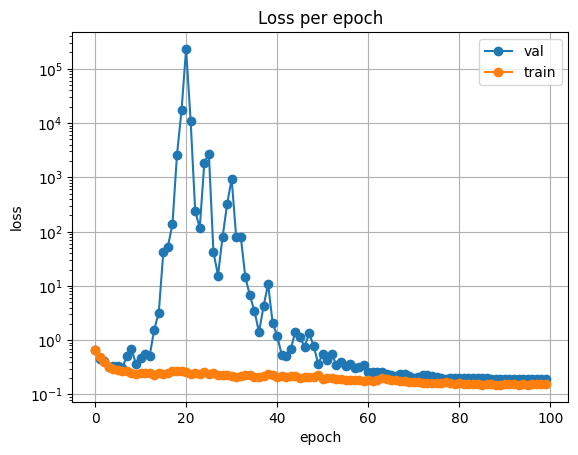

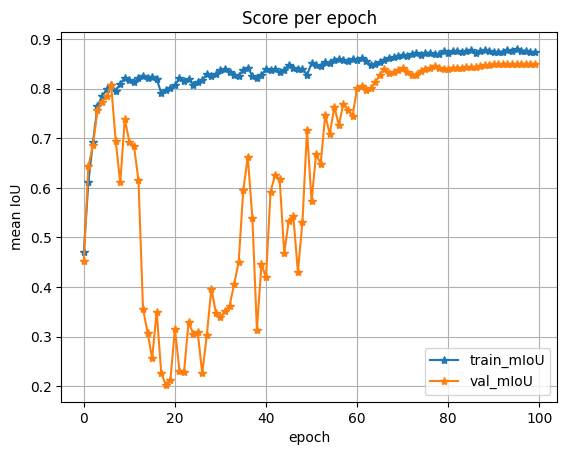

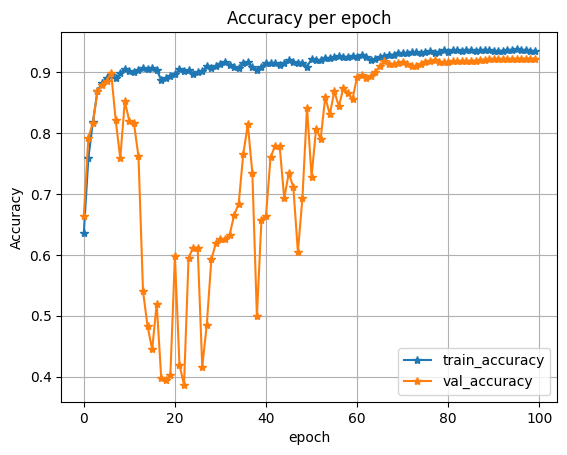

In [41]:
plot_loss(history)
plot_score(history)
plot_acc(history)

In [42]:
def predict_image_mask_miou(model, image, mask):
    model.eval()  # Set model to evaluation mode

    # Move image and mask to the device (GPU/CPU)
    model.to(device)
    image = image.to(device)
    mask = mask.to(device)

    with torch.no_grad():  # Disable gradient calculation for inference
        output = model(image)  # Get model output
        
        # Calculate mIoU score between predicted output and mask
        score = mIoU(output, mask)

        # Get the predicted mask by taking the argmax along the channel dimension
        masked = torch.argmax(output, dim=1).cpu().squeeze(0)

        # Optionally permute the output dimensions if necessary
        output = output.permute(0, 2, 3, 1)

    return masked, score, output


In [43]:
def predict_image_mask_pixel(model, image, mask):
    model.eval()  # Set model to evaluation mode

    # Move image and mask to the device (GPU/CPU)
    model.to(device)
    image = image.to(device)
    mask = mask.to(device)

    with torch.no_grad():  # Disable gradient calculation for inference
        output = model(image)  # Get model output

        # Calculate accuracy between predicted output and mask
        acc = pixel_accuracy(output, mask)

        # Get the predicted mask by taking the argmax along the channel dimension
        masked = torch.argmax(output, dim=1).cpu().squeeze(0)

        # Optionally permute the output dimensions if necessary
        output = output.permute(0, 2, 3, 1)

    return masked, acc, output

In [44]:
def calculate_scores(data_loader):
    mious = []
    accs = []

    for batch_idx, (images, masks) in enumerate(data_loader):
        images = images.to(device) 
        masks = masks.to(device)

        with torch.no_grad():
            outputs = model(images)

            for i in range(images.size(0)):
                pred_mask = outputs[i:i + 1]  # Take the output for the ith image
                mask = masks[i:i + 1]  # Take the ground truth mask for the ith image
                
                # Calculate mIoU and pixel accuracy
                miou = mIoU(pred_mask, mask)
                acc = pixel_accuracy(pred_mask, mask)
                
                mious.append(miou)
                accs.append(acc)

    return mious, accs

In [45]:
def compare_mask_to_prediction(data_loader, num_images=8):
    for batch_idx, (images, masks) in enumerate(data_loader):
        images = images.to(device)
        masks = masks.to(device)

        with torch.no_grad():
            outputs = model(images)

            # Only visualize for the first batch
            if batch_idx == 0:  
                # Set up the grid for plotting
                plt.figure(figsize=(12, 12))
                grid_size = 4  # Determine grid size
                
                for i in range(min(num_images, images.size(0))):  # Limit to num_images
                    pred_mask = outputs[i:i + 1]  # Take the output for the ith image
                    mask = masks[i:i + 1]  # Take the ground truth mask for the ith image

                    true_mask = mask.squeeze().cpu().numpy()  # Ground truth mask
                    pred_mask = torch.argmax(F.softmax(pred_mask, dim=1), dim=1).squeeze().cpu().numpy()  # Predicted mask

                    # Create a blank canvas for visualization
                    visualization = np.zeros((true_mask.shape[0], true_mask.shape[1], 3), dtype=np.uint8)

                    # Define colors
                    true_positive_color = [0, 255, 0]   # Green
                    false_positive_color = [255, 0, 0]  # Red
                    false_negative_color = [0, 0, 255]  # Blue

                    # Identify true positives, false positives, and false negatives
                    true_positive = (pred_mask == true_mask) & (true_mask > 0)
                    false_positive = (pred_mask != true_mask) & (pred_mask > 0)
                    false_negative = (pred_mask != true_mask) & (true_mask > 0)

                    # Fill the canvas with colors
                    visualization[true_positive] = true_positive_color  # Green for true positives
                    visualization[false_positive] = false_positive_color  # Red for false positives
                    visualization[false_negative] = false_negative_color  # Blue for false negatives

                    # Add to the grid
                    plt.subplot(grid_size, grid_size, i + 1)
                    plt.imshow(visualization)
                    plt.title(f"Image {i + 1}")
                    plt.axis('off')

                plt.tight_layout()  # Adjust layout
                plt.show()

                break

In [46]:
import torchvision.transforms as transforms

def predict_and_display(image_path, model, device):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    original_size = image.size
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ])
    image_tensor = transform(image).unsqueeze(0).to(device)

    # Make prediction
    with torch.no_grad():
        output = model(image_tensor)
        pred_mask = torch.argmax(F.softmax(output, dim=1), dim=1).squeeze().cpu().numpy()

    # Post-process the prediction
    pred_mask = Image.fromarray(pred_mask.astype(np.uint8)).resize(original_size, Image.NEAREST)

    # Display the original image and the prediction
    plt.figure(figsize=(12, 6))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')

    # Predicted mask overlayed on the original image
    plt.subplot(1, 2, 2)
    plt.imshow(image)
    plt.imshow(pred_mask, cmap='jet', alpha=0.5)
    plt.title('Predicted Mask Overlay')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [47]:
def visualize_overlay_predictions(data_loader, num_images=4, alpha=0.5):
    for batch_idx, (images, masks) in enumerate(data_loader):
        images = images.to(device)
        masks = masks.to(device)

        with torch.no_grad():
            outputs = model(images)

            # Only visualize for the first batch
            if batch_idx == 0:
                plt.figure(figsize=(15, num_images * 3))  # Adjusted for better layout
                
                for i in range(min(num_images, images.size(0))):  # Limit to num_images
                    original_image = images[i].cpu().numpy().transpose(1, 2, 0)  # Convert to HWC
                    pred_mask = outputs[i:i + 1]  # Take the output for the ith image
                    pred_mask = torch.argmax(F.softmax(pred_mask, dim=1), dim=1).squeeze().cpu().numpy()  # Predicted mask

                    # Convert to PIL Images
                    image = Image.fromarray((original_image * 255).astype(np.uint8))  # Scale to [0, 255]
                    mask = Image.fromarray((pred_mask * 255).astype(np.uint8))  # Scale to [0, 255]

                    # Apply a color map to the mask to overlay
                    mask_colored = ImageOps.colorize(mask, black="black", white="red")

                    # Overlay the mask onto the image using the alpha value
                    overlay = Image.blend(image, mask_colored, alpha=alpha)

                    # Set the aspect ratio correctly
                    plt.subplot(num_images, 2, 2 * i + 1)
                    plt.imshow(image)
                    plt.title(f"Original Image {i + 1}")
                    plt.axis('off')

                    plt.subplot(num_images, 2, 2 * i + 2)
                    plt.imshow(overlay)
                    plt.title(f"Image with Mask Overlay {i + 1}")
                    plt.axis('off')

                plt.tight_layout()
                plt.show()

                break 

In [48]:
mious, accs = calculate_scores(test_dataloader)
print(np.mean(mious), np.mean(accs))

0.8005987751659904 0.9090525488212526


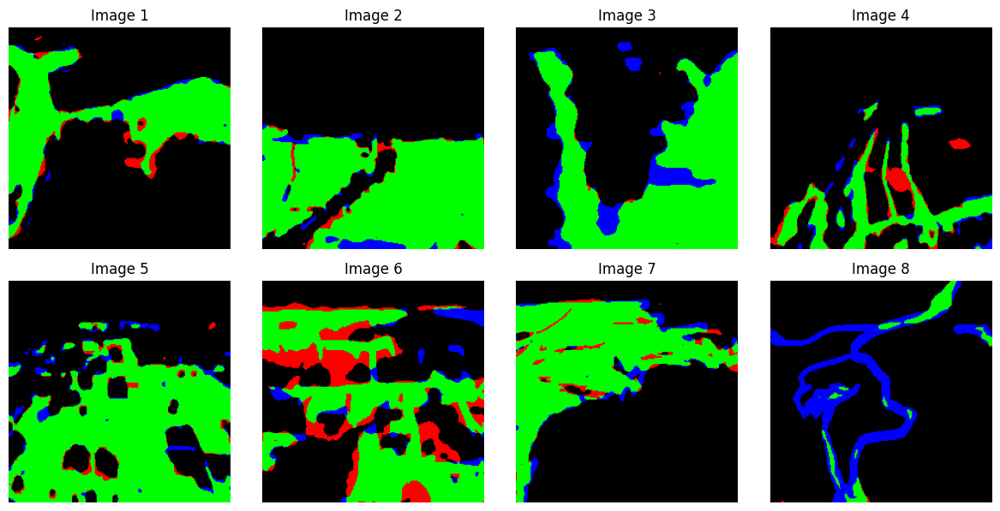

In [49]:
compare_mask_to_prediction(test_dataloader)

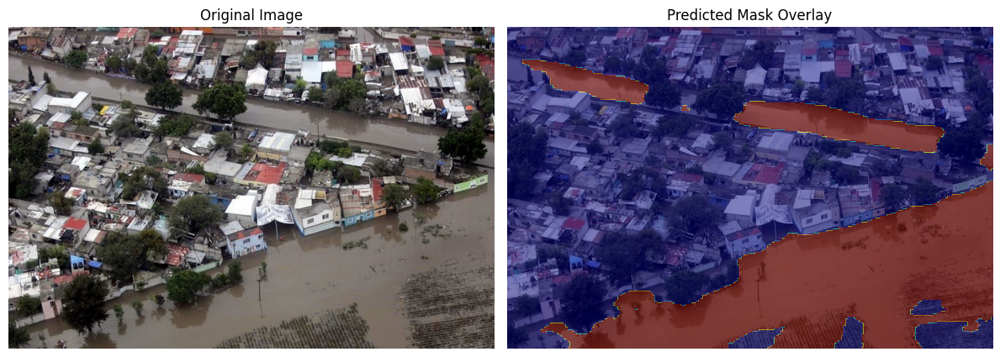

In [50]:
path = "/kaggle/input/prueba-2/Screenshot from 2024-11-06 10-06-04.png"
predict_and_display(path, model, device)